# Advanced Lane Finding

## Udacity Self Driving Car Engineer Nanodegree - Project 4

The goal of this project is to write a software pipeline to identify lane boundaries. As input we take a video stream from a forward-facing camera mounted on the front of a car, and we will output a annotated video.

In [56]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from collections import deque
from IPython.display import HTML
%matplotlib inline

### Step 1: Camera Calibration and Distortion Correction

The first step in the project is to remove any distortion from the images by calculating the camera calibration matrix and distortion coefficients using a series of images of a chessboard.

In [57]:
# Make a list of calibration images
camera_cal_files = glob.glob('camera_cal/cal*.jpg')

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.


# Step through the list and search for chessboard corners
for idx, fname in enumerate(camera_cal_files):
    img = cv2.imread(fname)
    print(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)


print ('done')


camera_cal/calibration1.jpg
camera_cal/calibration10.jpg
camera_cal/calibration11.jpg
camera_cal/calibration12.jpg
camera_cal/calibration13.jpg
camera_cal/calibration14.jpg
camera_cal/calibration15.jpg
camera_cal/calibration16.jpg
camera_cal/calibration17.jpg
camera_cal/calibration18.jpg
camera_cal/calibration19.jpg
camera_cal/calibration2.jpg
camera_cal/calibration20.jpg
camera_cal/calibration3.jpg
camera_cal/calibration4.jpg
camera_cal/calibration5.jpg
camera_cal/calibration6.jpg
camera_cal/calibration7.jpg
camera_cal/calibration8.jpg
camera_cal/calibration9.jpg
done


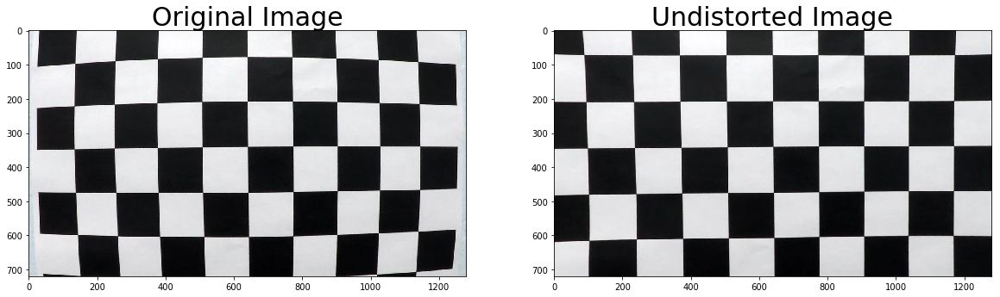

In [58]:
import pickle
%matplotlib inline

# Test undistortion on an image
test_img = cv2.imread('examples/test_image.jpg')
img_size = (test_img.shape[1], test_img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Remove distortion from images
def undistort(image):
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    return dst

dst = undistort(test_img)
cv2.imwrite('examples/test_undist.jpg',dst)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

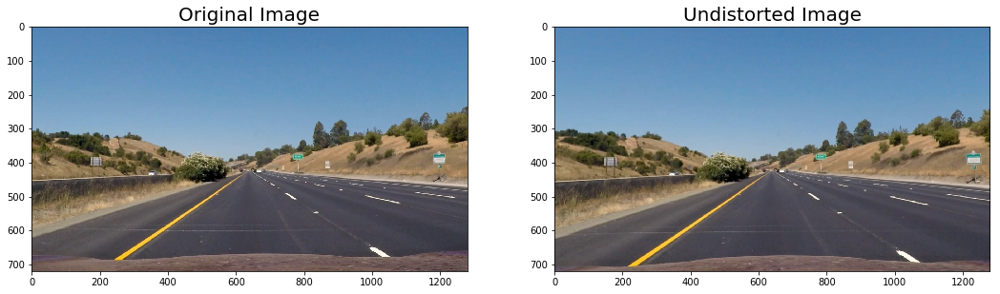

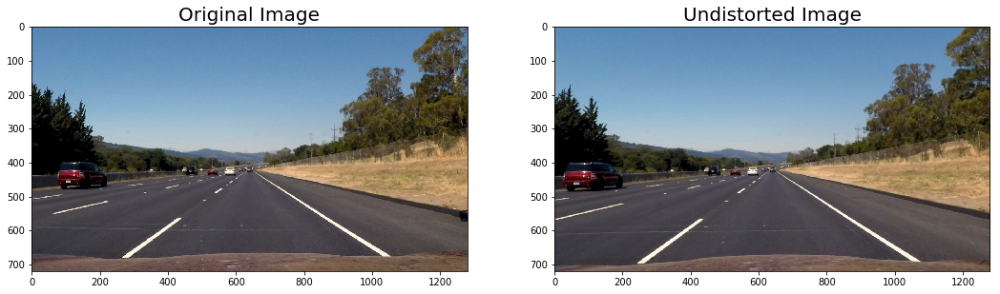

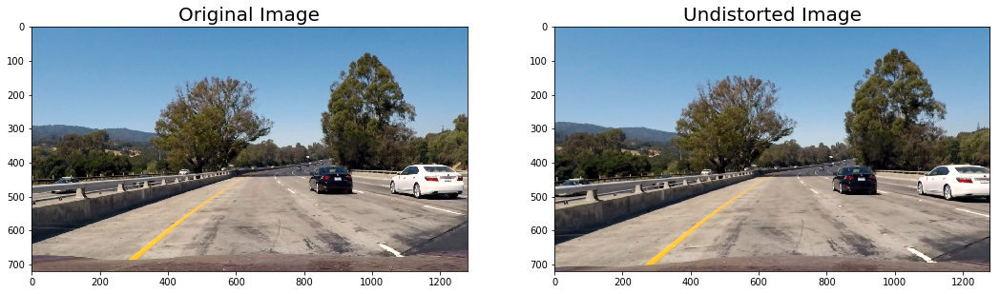

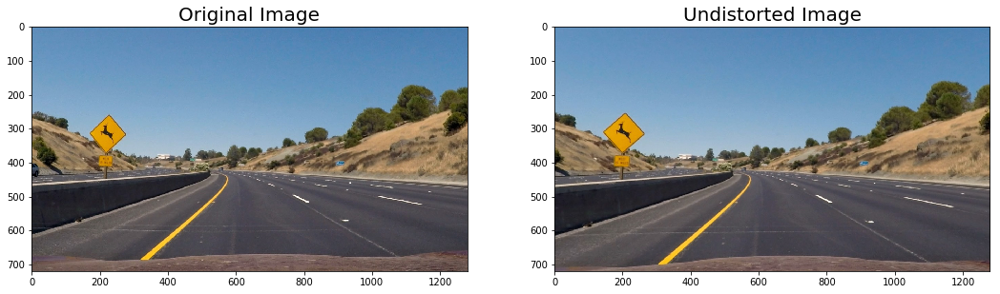

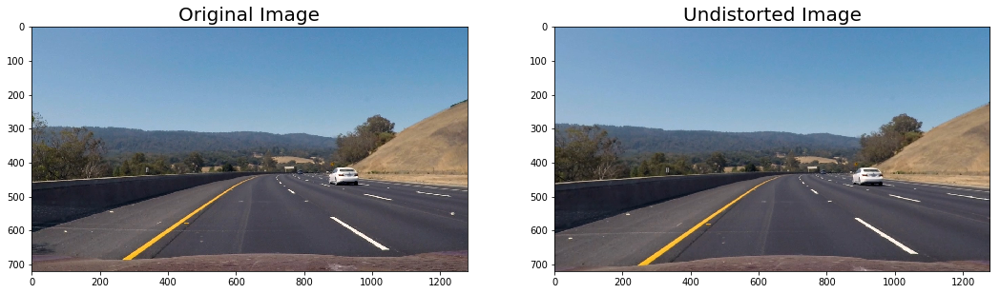

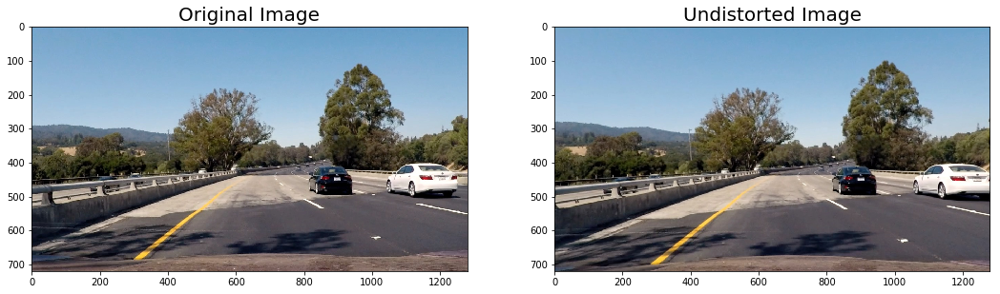

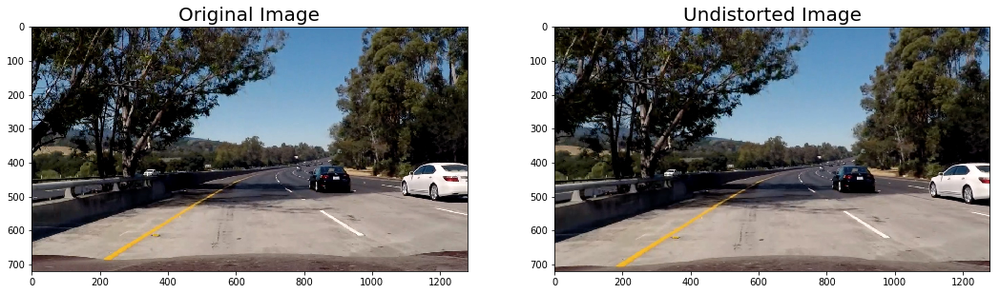

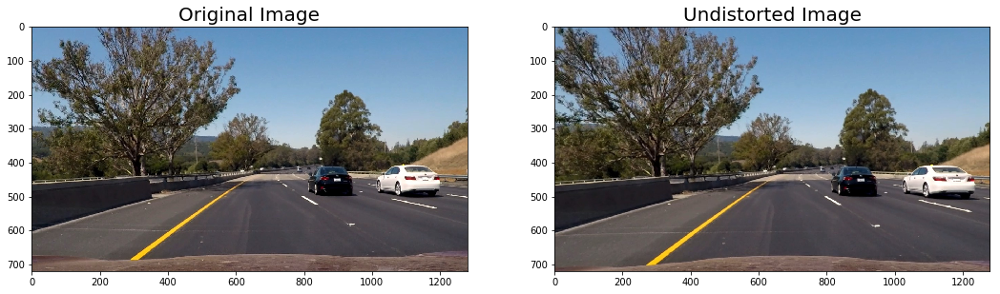

In [59]:
images = glob.glob('test_images/*.jpg')

for image in images:
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_undist = undistort(image)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,12))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(img_undist)
    ax2.set_title('Undistorted Image', fontsize=20)

### Step 2: Perspective Transform

In this step a perspective transform to convert the  binary image into "birds-eye view" is applied.

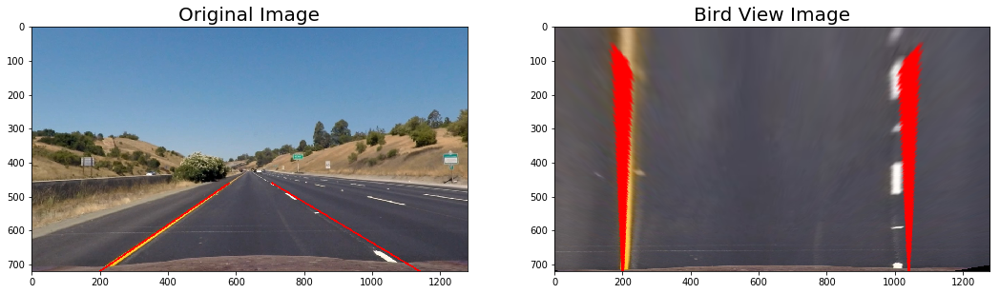

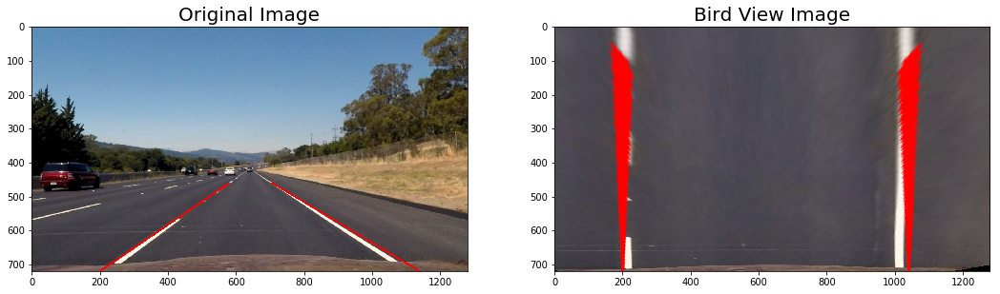

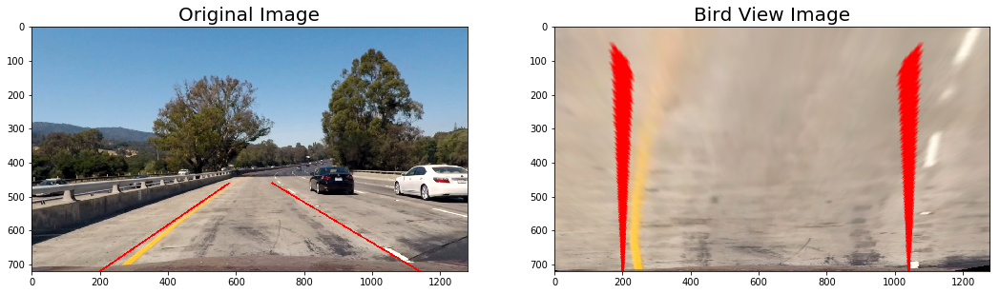

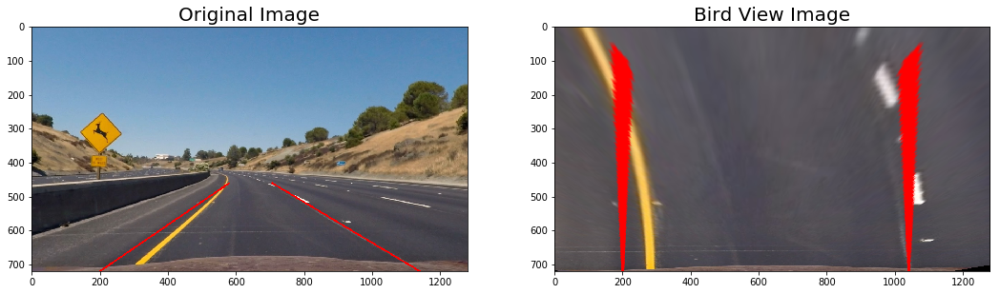

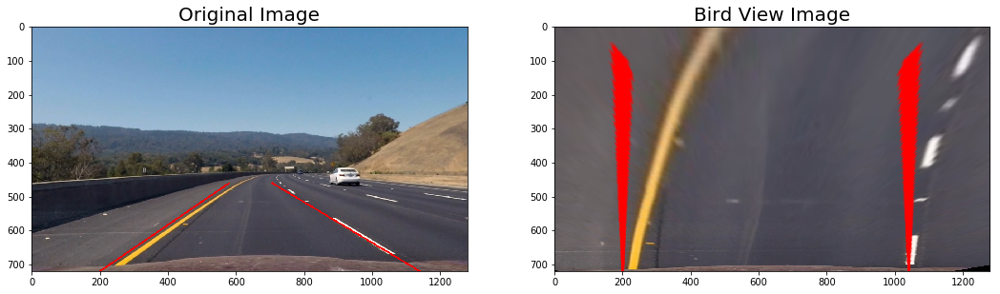

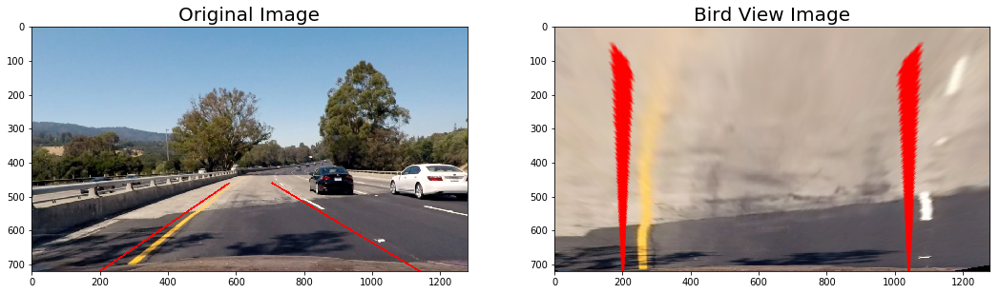

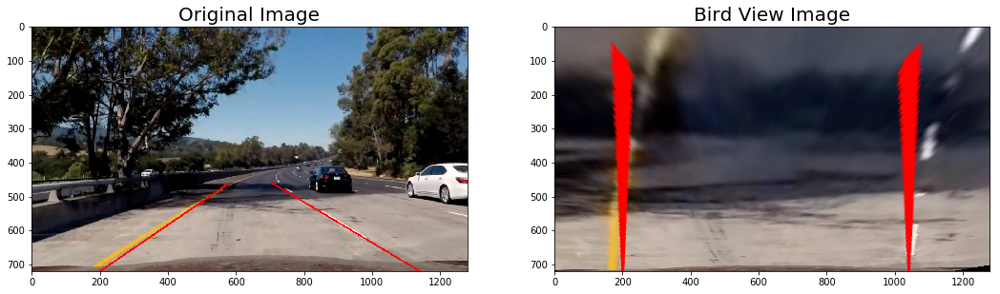

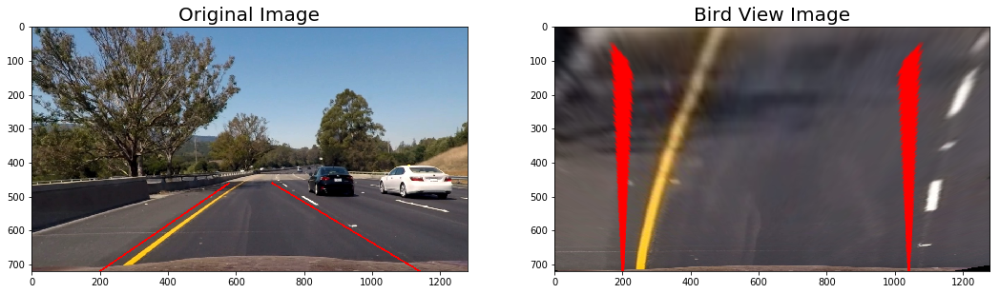

In [60]:
def perspective_transform(img, inverse=False):
    # Source coords for perspective transform
    src_coords = np.float32(
        [[580, 460],
         [200, 720],
         [706, 460],
         [1140, 720]])
    
    dst_coords = np.float32(
        [[200, 100],
         [200, 720],
         [1040, 100],
         [1040, 720]])
    
    # Perspective Transform matrix
    perspective_M = cv2.getPerspectiveTransform(src_coords, dst_coords)

    # Inverse Perspective Transform matrix
    inverse_perspective_M = cv2.getPerspectiveTransform(dst_coords, src_coords)
    img_size = (img.shape[1], img.shape[0])
    
    if inverse:
        img_bird = cv2.warpPerspective(img, inverse_perspective_M, img_size, flags=cv2.INTER_LINEAR)
    
    else:
        img_bird = cv2.warpPerspective(img, perspective_M, img_size, flags=cv2.INTER_LINEAR)
    
    return img_bird


for image in images:
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_undist = undistort(image)
    cv2.line(img_undist, (580, 460), (200, 720), (255,0,0), 4)
    cv2.line(img_undist, (706, 460), (1140, 720), (255,0,0), 4)
    img_bird = perspective_transform(img_undist)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,12))
    ax1.imshow(img_undist)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(img_bird)
    ax2.set_title('Bird View Image', fontsize=20)
    

### Step 3: Apply Binary Thresholds

In this step color transforms and gradients are used to create a thresholded binary image

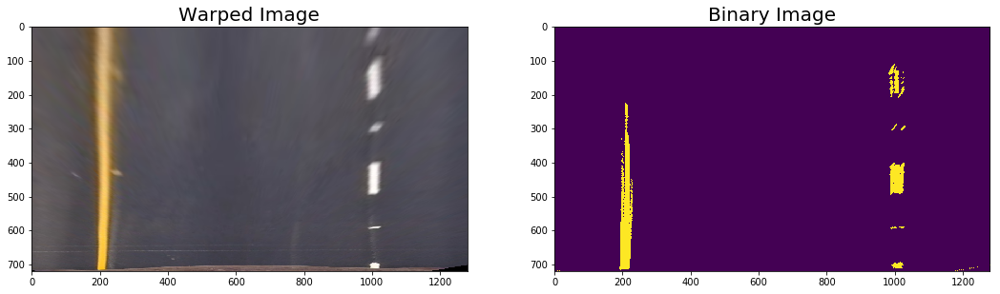

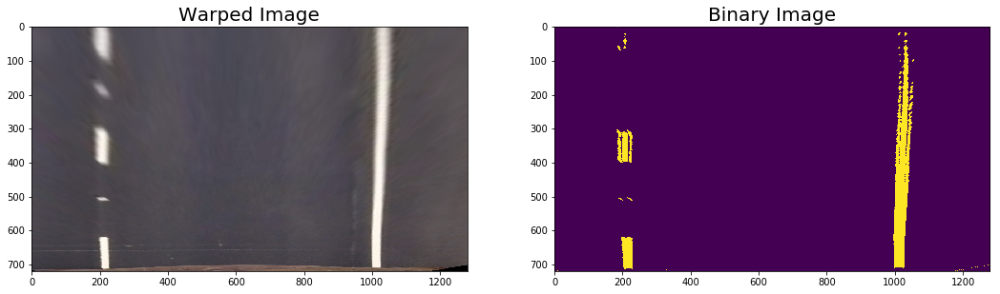

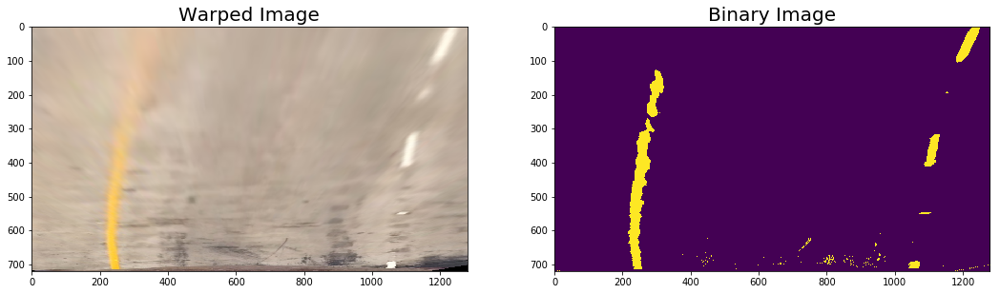

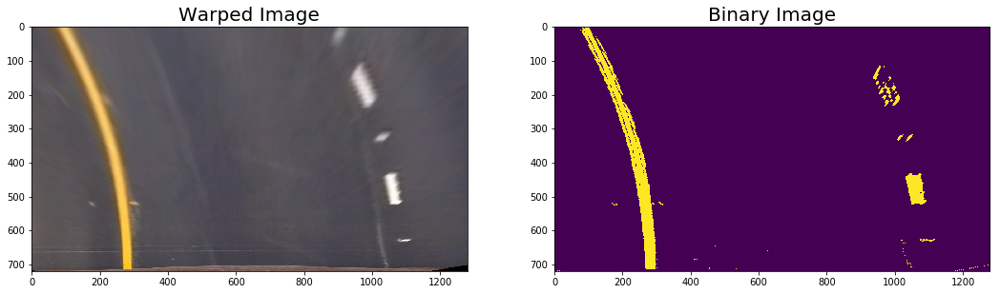

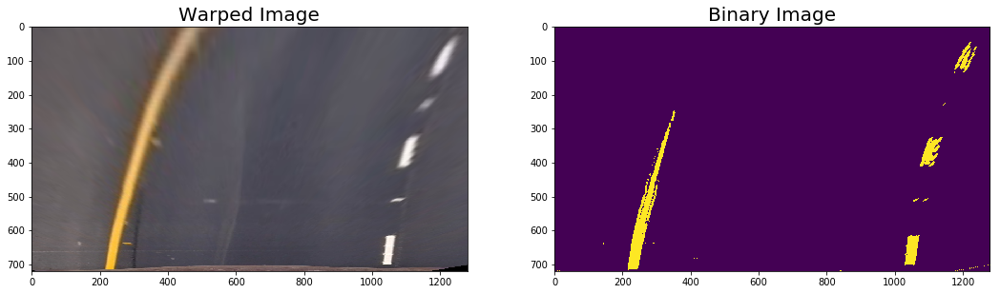

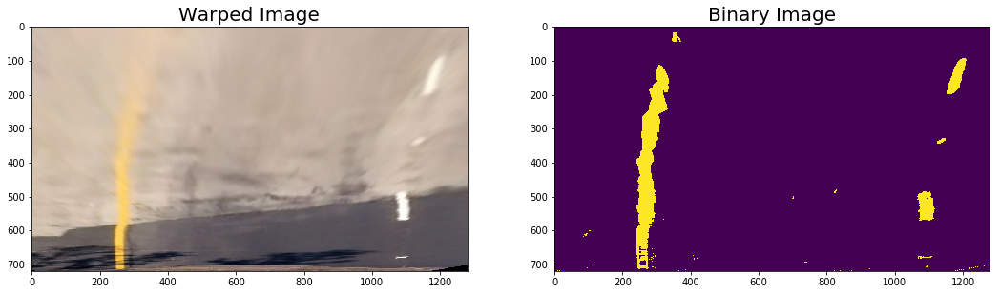

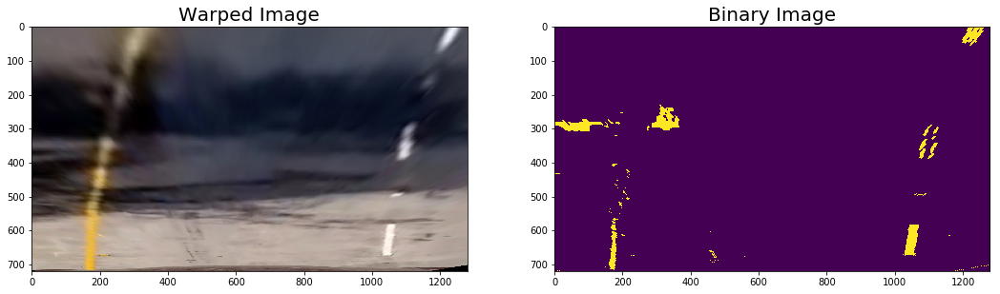

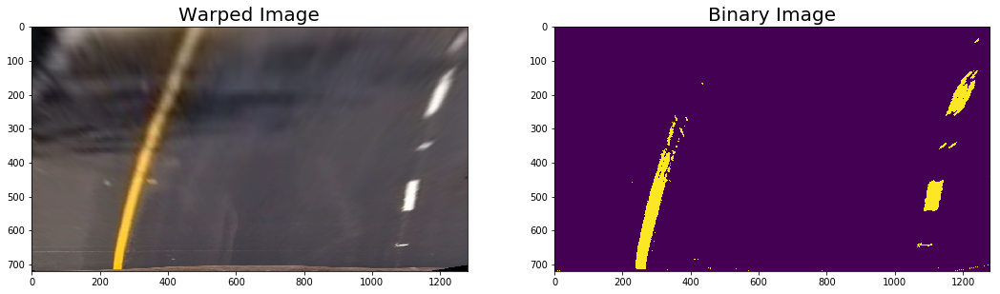

In [61]:
def color_grad_thresh(image):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    s_channel = hls[:,:,2]
    v_channel = hsv[:,:,2]
    r_channel = image[:,:,0]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 40
    thresh_max = 250
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold S color channel
    s_thresh_min = 230
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # Threshold V color channel
    v_thresh_min = 230
    v_thresh_max = 255
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= v_thresh_min) & (v_channel <= v_thresh_max)] = 1
    
    # Threshold R color channel
    #r_thresh_min = 180
    #r_thresh_max = 255
    #r_binary = np.zeros_like(r_channel)
    #r_binary[(r_channel >= r_thresh_min) & (r_channel <= r_thresh_max)] = 1
    
    # Combine V ans S color channels
    combined_colors = np.zeros_like(s_channel)
    combined_colors[(s_binary == 1) | (v_binary == 1)] = 1
    

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(combined_colors == 1) | (sxbinary == 1)] = 1
    
    return combined_binary


for image in images:
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_undist = undistort(image)
    img_warped = perspective_transform(img_undist)
    img_binary = color_grad_thresh(img_warped)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,12))
    ax1.imshow(img_warped)
    ax1.set_title('Warped Image', fontsize=20)
    ax2.imshow(img_binary)
    ax2.set_title('Binary Image', fontsize=20)

### Steps 4, 5 and 6: Fitting a polynomial to the lane lines, calculating vehicle position and radius of curvature:



In [62]:
# Helper functions

def radius_of_curvature(xvals, yvals):
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
    return curverad


def get_intercepts(polynomial):
    bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
    top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
    return bottom, top


def fill_lane(binary_warped):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 12
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Measure Radius of Curvature for each lane line
    left_curverad = radius_of_curvature(leftx, lefty)
    right_curverad = radius_of_curvature(rightx, righty)
    curvature = int((left_curverad + right_curverad)/2)
    
    # Get intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = get_intercepts(right_fit)
    leftx_int, left_top = get_intercepts(left_fit)
    
    # Get vehicle position with respect to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    
    newwarp = perspective_transform(color_warp, inverse=True)
    # Combine the result with the original image
    result = cv2.addWeighted(img_undist, 1, newwarp, 0.3, 0)
    
    # Print distance from center on video
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 3)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 3)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(curvature), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 3)
    

    return result
    

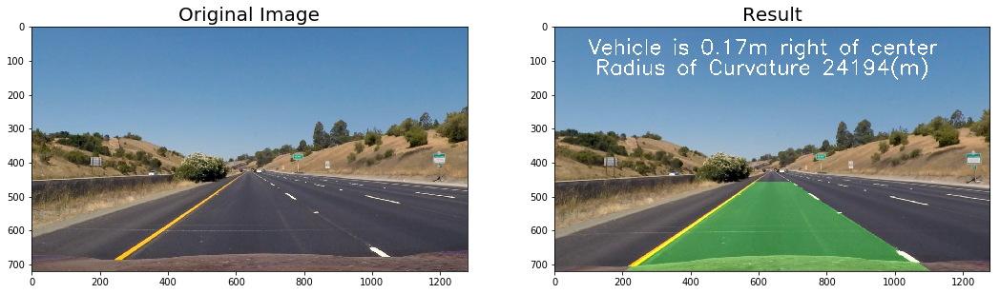

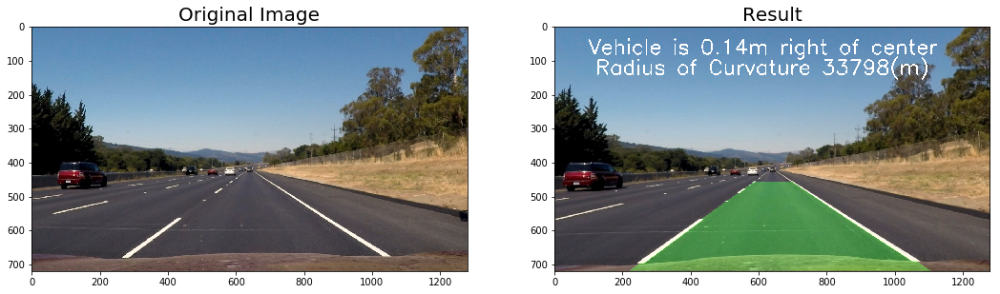

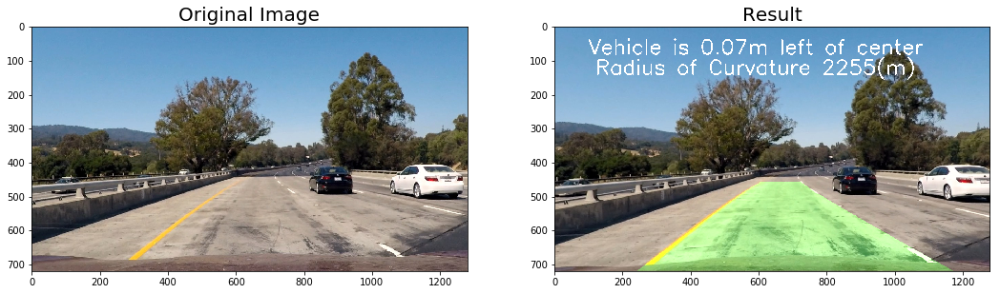

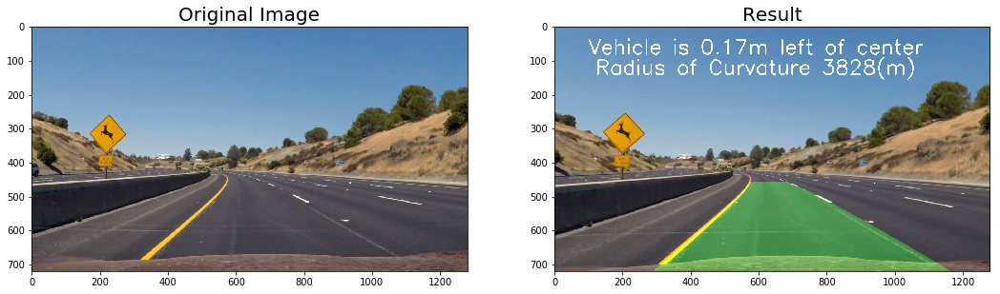

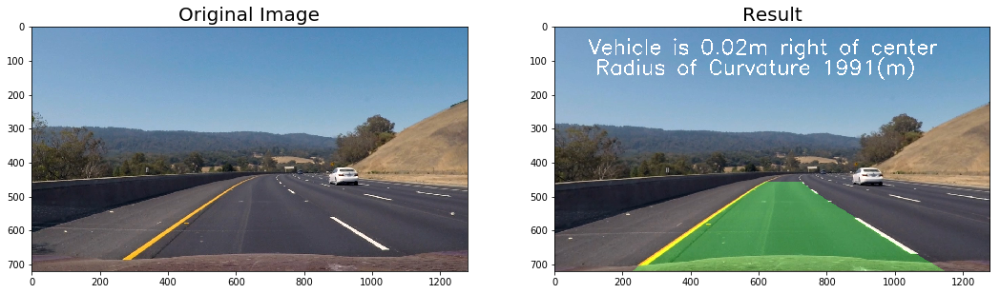

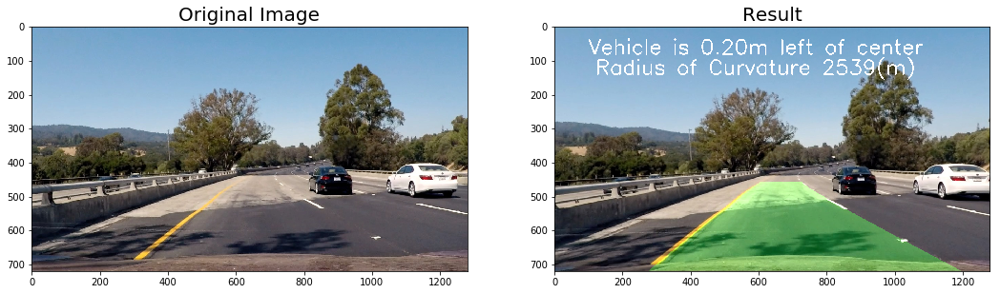

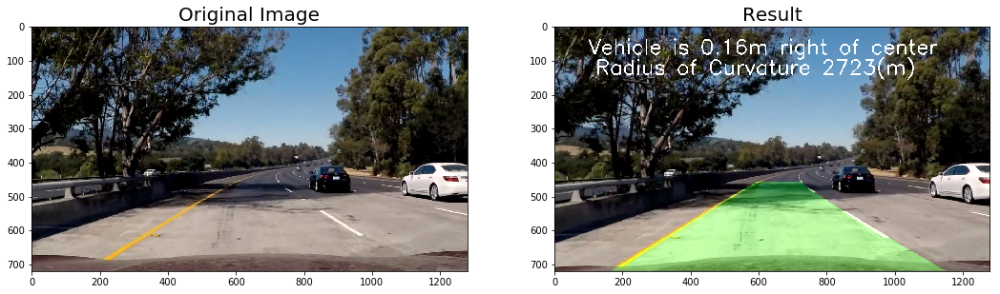

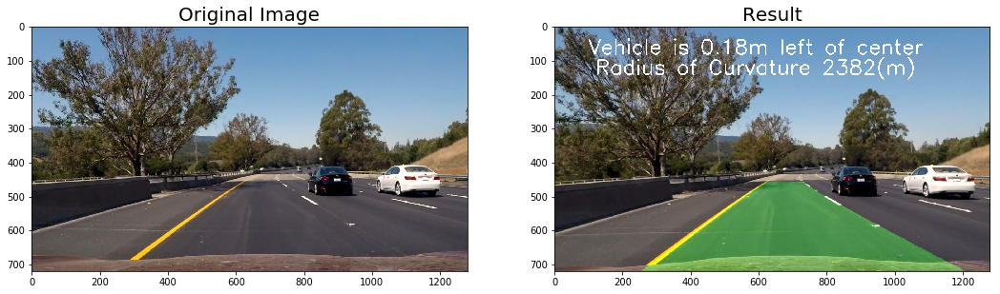

In [63]:
for image in glob.glob('test_images/*.jpg'):
    
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_undist = undistort(img)
    img_warped = perspective_transform(img)
    img_binary = color_grad_thresh(img_warped)
    
    result = fill_lane(img_binary)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,12))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(result)
    ax2.set_title('Result', fontsize=20)
    

## Video Processing Pipeline:

First I am going to establish a class Line() for the lines to store attributes about the lane lines from one frame to the next. Inside the class I will define several functions which will be used to detect the pixels belonging to each lane line.

The idea to take the running average of the polynomial coefficients and intercept values was taken from Justin Heaton.

In [64]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # current x values for detected lane
        self.currentX = None
        # current y values for detected lane
        self.currentY = None
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        # x values of the last n fits of the line
        self.current_xfitted = None
        # polynomial coefficients for the last 30 fits of the line
        self.recent_fits = deque(maxlen=90)
        # x values of the last n fits of the line
        #self.recent_xfitted = [] 
        #average x values of the fitted line over the last 30 iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last 30 iterations
        self.best_fit = None 
        # top and bottom intercepts for the last 30 fits of the line
        self.intercepts = deque(maxlen=90)
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
       
        
    def detected_search(self, binary_warped):
        '''
        This function is applied when the lane lines have been detected in the previous frame.
        '''
       
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        # It's now much easier to find line pixels!
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
       
        lane_inds = ((nonzerox > (self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + self.current_fit[2] - margin)) & (nonzerox < (self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + self.current_fit[2] + margin))) 
        

        # Again, extract left and right line pixel positions
        xvals = nonzerox[lane_inds]
        yvals = nonzeroy[lane_inds] 
        

        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
        
        return xvals, yvals, self.found
    
    def blind_search(self, binary_warped):
        '''
        This function is applied in the first few frames and/or if the lane was not successfully detected
        in the previous frame. 
        '''
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        if self == Right:
            base = np.argmax(histogram[midpoint:]) + midpoint
        else:
            base = np.argmax(histogram[:midpoint])

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        current = base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive pixel indices
        inds = []
    
        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_x_low = current - margin
            win_x_high = current + margin
            # Identify the nonzero pixels in x and y within the window
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
            
            # Append these indices to the lists
            inds.append(good_inds)
        
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_inds) > minpix:
                current = np.int(np.mean(nonzerox[good_inds]))
    

        # Concatenate the arrays of indices
        inds = np.concatenate(inds)

        # Extract left and right line pixel positions
        xvals = nonzerox[inds]
        yvals = nonzeroy[inds] 
        
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
        
        return xvals, yvals, self.found
    
    
    def get_radius_of_curvature(self, xvals, yvals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    
    def mean_fit(self, polynomials):
        coef1 = [coef[0] for coef in polynomials]
        mean_coef1 = sum(coef1)/float(len(coef1))
        coef2 = [coef[1] for coef in polynomials]
        mean_coef2 = sum(coef2)/float(len(coef2))
        bias = [coef[2] for coef in polynomials]
        mean_bias = sum(bias)/float(len(bias))
    
        return [mean_coef1, mean_coef2, mean_bias]
    
    def mean_intercepts(self, intercepts):
        bottom = [x_coords[0] for x_coords in intercepts]
        top = [x_coords[1] for x_coords in intercepts]
        mean_bottom = sum(bottom)/float(len(bottom))
        mean_top = sum(top)/float(len(top))
    
        return mean_bottom, mean_top
    
    
    def get_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top

In [65]:
# Video Processing Pipeline
def process_vid(image):
    img_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    undist = undistort(image)
    
    # Perform perspective transform
    warped =  perspective_transform(undist)
    
    # Generate binary thresholded images
    combined_binary = color_grad_thresh(warped)
    
    
    # perform blind or detected seach for left lane
    if Left.detected == True: # search in a margin around the previous line position
        leftX, leftY, Left.detected = Left.detected_search(combined_binary)
    else: # do blind search
        leftX, leftY, Left.detected = Left.blind_search(combined_binary)
        
    # perform blind or detected seach for right lane
    if Right.detected == True: # search in a margin around the previous line position
        rightX, rightY, Right.detected = Right.detected_search(combined_binary)
    else: # do blind search
         rightX, rightY, Right.detected = Right.blind_search(combined_binary)


    Left.currentY = np.array(leftY).astype(np.float32)
    Left.currentX = np.array(leftX).astype(np.float32)
    Right.currentY = np.array(rightY).astype(np.float32)
    Right.currentX = np.array(rightX).astype(np.float32)
    
    
    # Fit polynomial to detected pixels for right lane
    Right.current_fit = np.polyfit(Right.currentY, Right.currentX, 2)
    # Calculate x values for current polynomial fit
    Right.current_xfitted  = Right.current_fit[0]* Right.currentY**2 + Right.current_fit[1]*Right.currentY + Right.current_fit[2]
  
    # Fit polynomial to detected pixels for left lane
    Left.current_fit = np.polyfit(Left.currentY,  Left.currentX, 2)
    # Calculate x values for current polynomial fit
    Left.current_xfitted = Left.current_fit[0]* Left.currentY**2 + Left.current_fit[1]* Left.currentY + Left.current_fit[2]
    
    # calculate running avarage for polynimial coefficients 
    Right.recent_fits.append(Right.current_fit)
    Left.recent_fits.append(Left.current_fit)
        
    Right.best_fit = Right.mean_fit(Right.recent_fits)
    Left.best_fit = Left.mean_fit(Left.recent_fits)
    # Calculate x values for best polynomial fit
    Left.best_xfitted = Left.best_fit[0]* Left.currentY**2 + Left.best_fit[1]* Left.currentY + Left.best_fit[2]
    Right.best_xfitted = Right.best_fit[0]* Right.currentY**2 + Right.best_fit[1]* Right.currentY + Right.best_fit[2]
    
    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    leftx_bottom, left_top = Left.get_intercepts(Left.best_fit)
    rightx_bottom, right_top = Right.get_intercepts(Right.best_fit)
    
    # Average intercepts across 30 frames
    Left.intercepts.append([leftx_bottom, left_top])
    Right.intercepts.append([rightx_bottom, right_top])
    leftx_bottom, left_top = Left.mean_intercepts(Left.intercepts)
    rightx_bottom, right_top = Right.mean_intercepts(Right.intercepts)
    
    # Add averaged intercepts to current x and y vals
    Left.currentX = np.insert(Left.currentX, 0, left_top, axis=0)
    Left.currentY = np.insert(Left.currentY, 0, 0, axis=0)
    Left.currentX = np.append(Left.currentX,leftx_bottom)
    Left.currentY = np.append(Left.currentY, 720.0)
    Right.currentX = np.insert(Right.currentX, 0, right_top, axis=0)
    Right.currentY = np.insert(Right.currentY, 0, 0, axis=0)
    Right.currentX = np.append(Right.currentX, rightx_bottom)
    Right.currentY = np.append(Right.currentY, 720.0)
    
    # Fit a new polynomial to the pixels including the averaged intercepts
    Right.current_fit = np.polyfit(Right.currentY, Right.currentX, 2)
    Right.current_xfitted  = Right.current_fit[0]* Right.currentY**2 + Right.current_fit[1]*Right.currentY + Right.current_fit[2]
  
    Left.current_fit = np.polyfit(Left.currentY,  Left.currentX, 2)
    Left.current_xfitted = Left.current_fit[0]* Left.currentY**2 + Left.current_fit[1]* Left.currentY + Left.current_fit[2]
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.current_xfitted, Left.currentY])))])
    pts_right = np.array([np.transpose(np.vstack([Right.current_xfitted, Right.currentY]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    newwarp =  perspective_transform(color_warp, inverse=True)
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)
    
    # Annotations
    # Compute radius of curvature for each lane in meters
    Left.radius_of_curvature = Left.get_radius_of_curvature(Left.current_xfitted, Left.currentY)
    Right.radius_of_curvature = Right.get_radius_of_curvature(Right.current_xfitted, Right.currentY)   
    # Calculate the vehicle position relative to the center of the lane
    position = (leftx_bottom + rightx_bottom)/2
    distance_from_center = abs((640 - position)*3.7/700) 
        
    # Add distance from center annotation
    if position > 640:
        
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                  fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                  fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
     
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((Left.radius_of_curvature+Right.radius_of_curvature)/2)), (120,140),
              fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
     

    #binary_vis =cv2.cvtColor(combined_binary*255,cv2.COLOR_GRAY2RGB)
    #vis = np.concatenate((result, binary_vis), axis=1)
    
    return result

In [66]:
Left = Line()
Right = Line()

clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile('result.mp4', audio=False)


HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1260/1261 [05:48<00:00,  3.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



In [67]:
Left = Line()
Right = Line()
video_output = 'challenge_result.mp4'
clip1 = VideoFileClip("challenge_video.mp4").subclip(0,2)
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile(video_output, audio=False)

HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('challenge_result.mp4'))

[MoviePy] >>>> Building video challenge_result.mp4
[MoviePy] Writing video challenge_result.mp4


100%|██████████| 60/60 [00:08<00:00,  7.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_result.mp4 



In [68]:
Left = Line()
Right = Line()
video_output = 'harder_challenge_result.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4").subclip(0,2)
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile(video_output, audio=False)

HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('harder_challenge_result.mp4'))

[MoviePy] >>>> Building video harder_challenge_result.mp4
[MoviePy] Writing video harder_challenge_result.mp4


 98%|█████████▊| 50/51 [00:16<00:00,  3.71it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_result.mp4 

